## YOLO Testing With ResNet50

In [1]:
!pip install torch torchvision --quiet

In [30]:
import torchvision.models as models
import torchvision.transforms as T
from torchvision import datasets, transforms, models
import torch
from PIL import Image
from data.data_loader import load_cifar10, load_cifar100, load_imagenet, load_coco, load_wider
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
from torchvision.datasets import CocoDetection
import json

from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.datasets import CIFAR100


### FASTERRCNN_RESNET50_FPN


https://pytorch.org/vision/main/models/generated/torchvision.models.detection.fasterrcnn_resnet50_fpn.html

In [4]:
# Load a pre-trained Faster R-CNN model
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [17]:
# Cifar 100
trainloader, testloader  = load_cifar100(batch_size=64)
# fetch the first batch of images
images, labels = next(iter(trainloader))

# Select the first image for testing
image = images[0]

# pre-trained model
model = models.detection.fasterrcnn_resnet50_fpn(weights=models.detection.FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
model.eval()

with torch.no_grad():
    prediction = model([image])

Files already downloaded and verified
Files already downloaded and verified


In [31]:
# def visualize_prediction(image, prediction, threshold=0.5):
#     # Images to numpy array
#     image_np = image.permute(1, 2, 0).numpy()

#     fig, ax = plt.subplots(1, figsize=(12, 9))
#     ax.imshow(image_np)

#     # Pull the bounding boxes and labels
#     for box, label, score in zip(prediction[0]['boxes'], prediction[0]['labels'], prediction[0]['scores']):
#         if score >= threshold:
#             x, y, xmax, ymax = box
#             rect = patches.Rectangle((x, y), xmax - x, ymax - y, linewidth=2, edgecolor='r', facecolor='none')
#             ax.add_patch(rect)
#             ax.text(x, y, f'Label: {label}, Score: {score:.2f}', color='white', backgroundcolor='red')

#     plt.show()

# visualize_prediction(image, prediction)

In [34]:
# dataset = CIFAR100(root='./data', train=False, download=True, transform=T.ToTensor())
# image, _ = dataset[0]  # Using the first image for an example

# # Run the model on the image
# with torch.no_grad():
#     prediction = model([image])

# def visualize_prediction(image, prediction, threshold=0.5):
#     image_np = image.permute(1, 2, 0).numpy()

#     fig, ax = plt.subplots(1, figsize=(12, 9))
#     ax.imshow(image_np)

#     for box, label, score in zip(prediction[0]['boxes'], prediction[0]['labels'], prediction[0]['scores']):
#         if score >= threshold:
#             x, y, xmax, ymax = box
#             rect = patches.Rectangle((x, y), xmax - x, ymax - y, linewidth=2, edgecolor='r', facecolor='none')
#             ax.add_patch(rect)
#             ax.text(x, y, f'Label: {label}, Score: {score:.2f}', color='white', backgroundcolor='red')

#     plt.show()

# visualize_prediction(image, prediction)

In [35]:

# # Load the COCO validation dataset (adjust paths if necessary)
# # Make sure to download and extract the dataset beforehand

# data_dir = '/home/ubuntu/W210-Capstone/notebooks/data_coco/data'
# # train_loader, test_loader = load_coco(data_dir)


# val_dataset = CocoDetection(root=f'{data_dir}/val2017', 
#                             annFile=f'{data_dir}/annotations/instances_val2017.json', 
#                             transform=T.Compose([T.ToTensor()]))

# # Load a single image from the COCO dataset
# image, target = val_dataset[0]  # Using the first image for demonstration

# # Load the pre-trained Faster R-CNN model
# model = fasterrcnn_resnet50_fpn(pretrained=True)
# model.eval()

# # Run the model on the image
# with torch.no_grad():
#     prediction = model([image])

# # Visualization function
# def visualize_prediction(image, prediction, threshold=0.5):
#     image_np = image.permute(1, 2, 0).numpy()
#     fig, ax = plt.subplots(1, figsize=(12, 9))
#     ax.imshow(image_np)

#     for box, label, score in zip(prediction[0]['boxes'], prediction[0]['labels'], prediction[0]['scores']):
#         if score >= threshold:
#             x, y, xmax, ymax = box
#             rect = patches.Rectangle((x, y), xmax - x, ymax - y, linewidth=2, edgecolor='r', facecolor='none')
#             ax.add_patch(rect)
#             ax.text(x, y, f'Label: {label}, Score: {score:.2f}', color='white', backgroundcolor='red')

#     plt.show()

# # Visualize the prediction
# visualize_prediction(image, prediction)


In [36]:
# import json

# # Load COCO category names
# with open(f'{data_dir}/annotations/instances_val2017.json') as f:
#     categories = json.load(f)['categories']
# category_dict = {cat['id']: cat['name'] for cat in categories}

# # Updated visualization function
# def visualize_prediction(image, prediction, threshold=0.5):
#     image_np = image.permute(1, 2, 0).numpy()
#     fig, ax = plt.subplots(1, figsize=(12, 9))
#     ax.imshow(image_np)

#     for box, label, score in zip(prediction[0]['boxes'], prediction[0]['labels'], prediction[0]['scores']):
#         if score >= threshold:
#             label_name = category_dict.get(label.item(), 'Unknown')  # Convert label ID to name
#             x, y, xmax, ymax = box
#             rect = patches.Rectangle((x, y), xmax - x, ymax - y, linewidth=2, edgecolor='r', facecolor='none')
#             ax.add_patch(rect)
#             ax.text(x, y, f'{label_name}, Score: {score:.2f}', color='white', backgroundcolor='red')

#     plt.show()

# # Visualize the prediction with category names
# visualize_prediction(image, prediction)


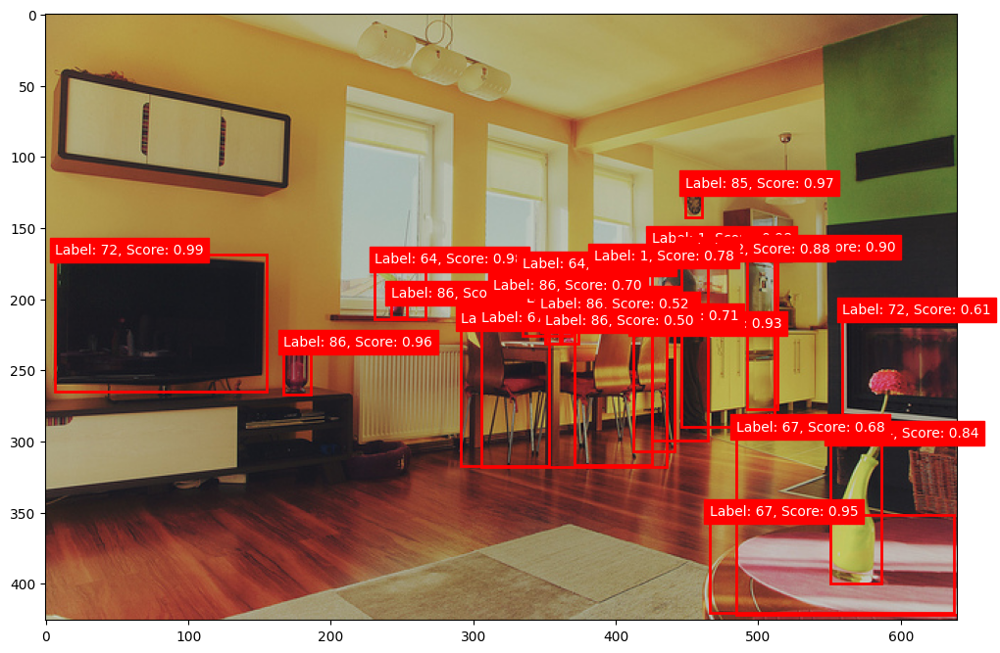

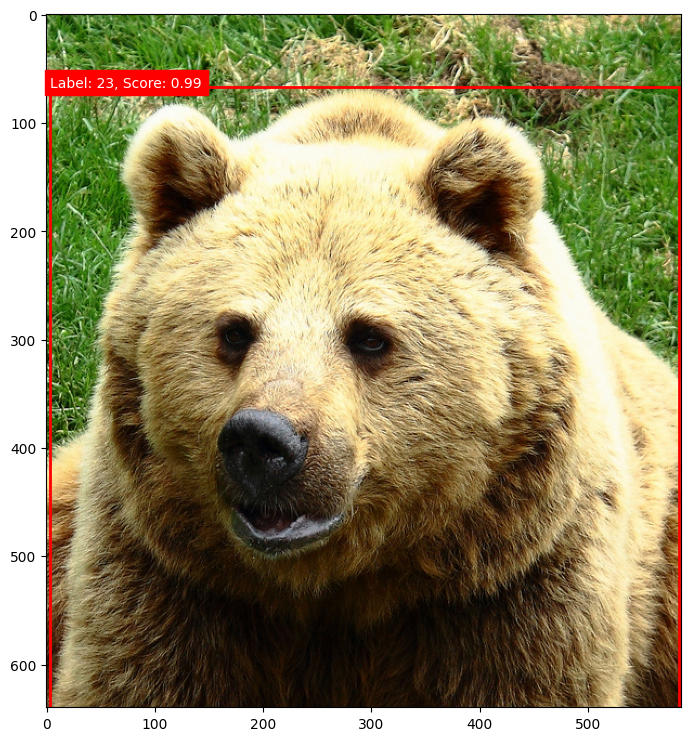

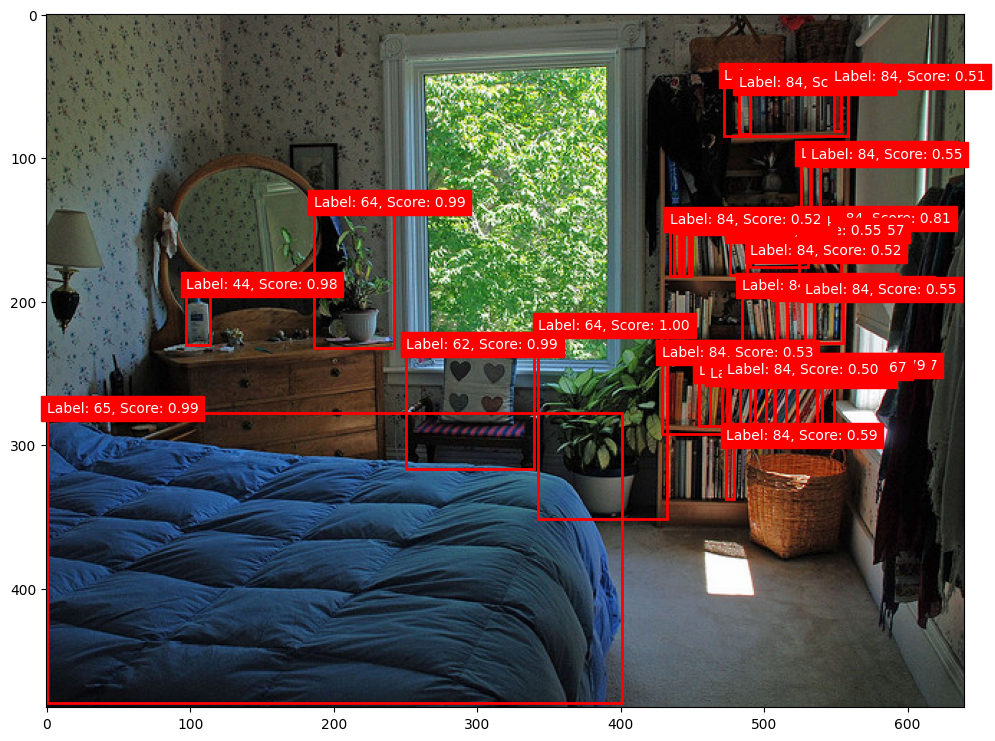

In [38]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Diplay example images
num_images_to_display = 3  


for i in range(num_images_to_display):

    image, target = val_dataset[i]

    model.eval() # resnet50
    with torch.no_grad():
        prediction = model([image])

    # Visualize the prediction for this image
    visualize_prediction(image, prediction)

    # Optional: Pause between images or use plt.show(block=True) to display one at a time
    plt.pause(1)


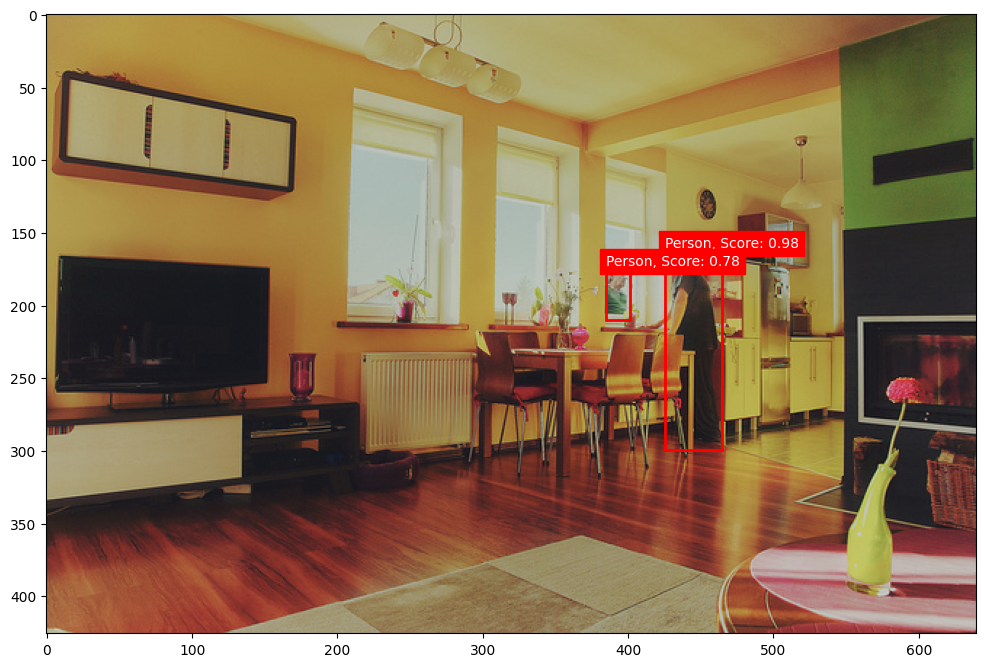

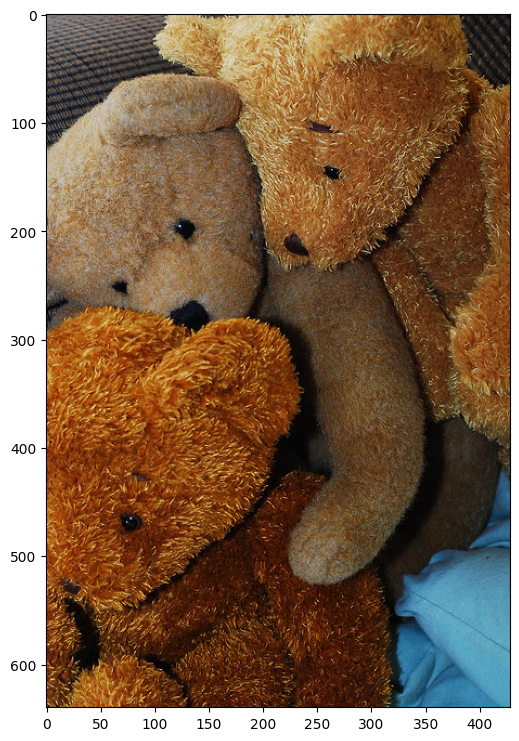

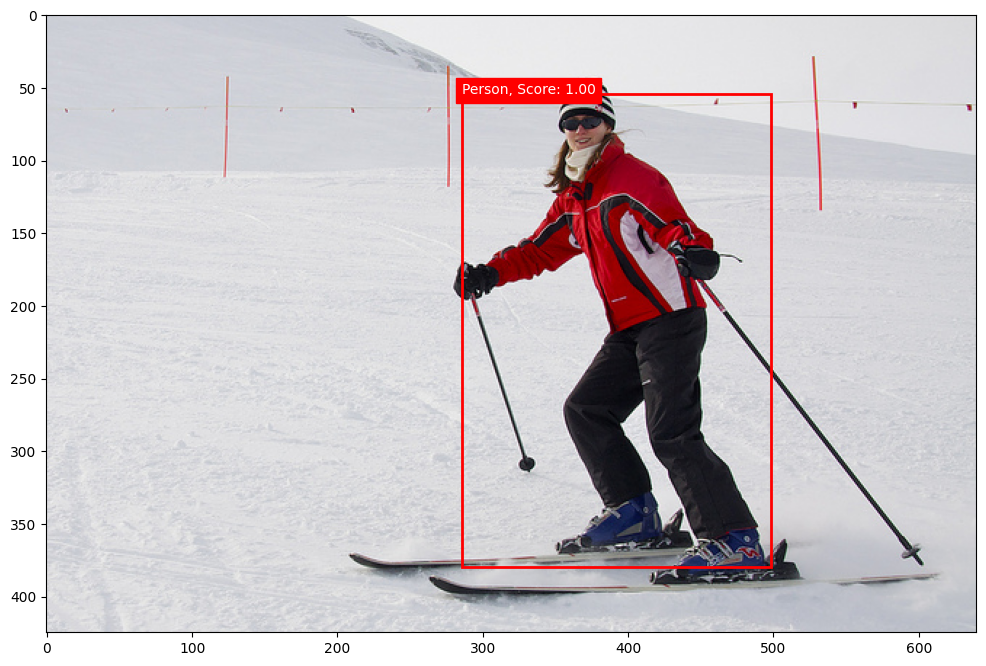

In [39]:
# Filter "person" predictions only - bounding box

def visualize_person_prediction(image, prediction, threshold=0.5):
    image_np = image.permute(1, 2, 0).numpy()
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image_np)

    person_detected = False
    for box, label, score in zip(prediction[0]['boxes'], prediction[0]['labels'], prediction[0]['scores']):
        if score >= threshold and label == 1:  # 1 == 'person'
            person_detected = True
            x, y, xmax, ymax = box
            rect = patches.Rectangle((x, y), xmax - x, ymax - y, linewidth=2, 
                                     edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(x, y, f'Person, Score: {score:.2f}', color='white', backgroundcolor='red')
    
    if person_detected:
        plt.show()

# Visualize predictions for three images where 'person' is detected
num_images_to_display = 3
images_displayed = 0
for image, target in val_dataset:
    model.eval()
    with torch.no_grad():
        prediction = model([image])

    if any(label == 1 for label in prediction[0]['labels']):
        visualize_person_prediction(image, prediction)
        images_displayed += 1
        if images_displayed >= num_images_to_display:
            break


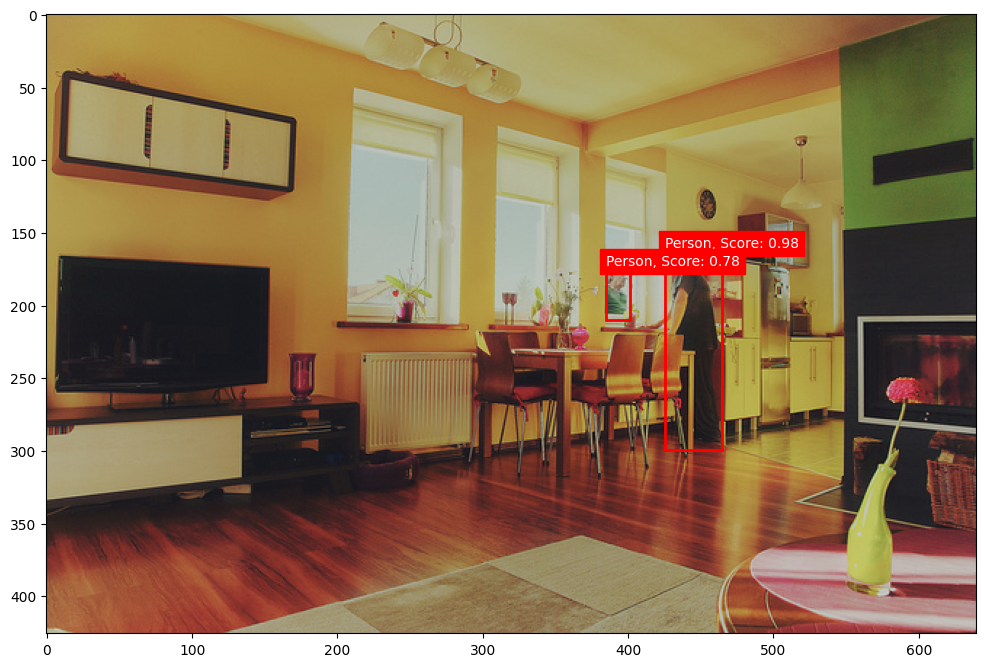

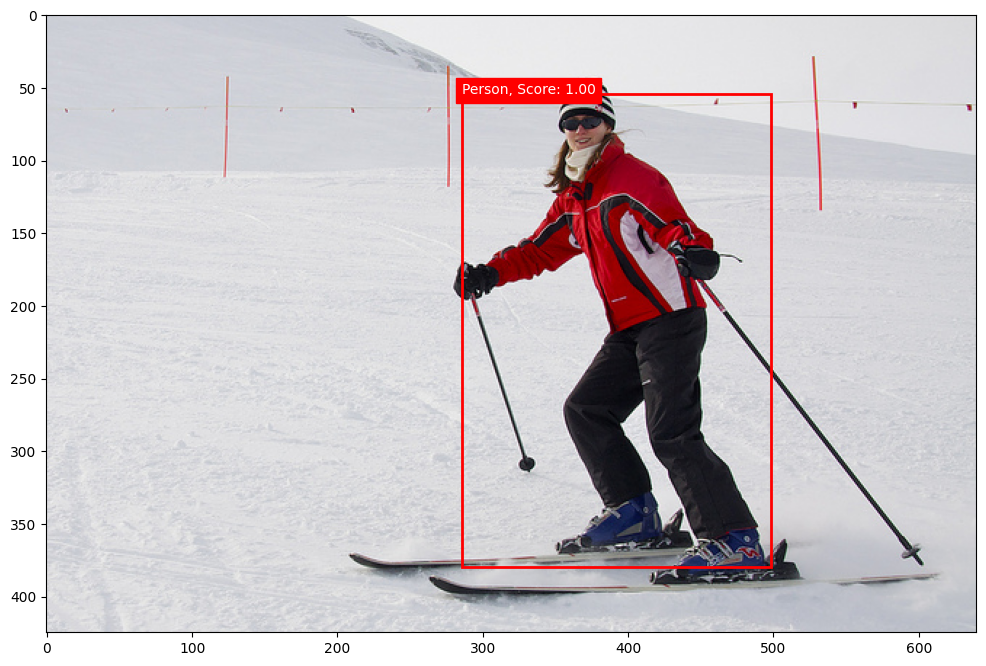

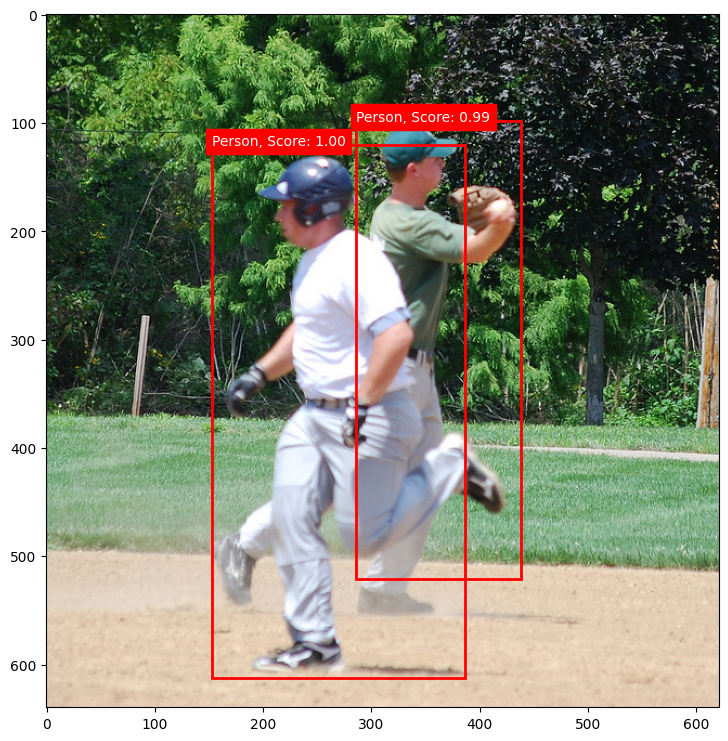

In [41]:
# Filter "person" predictions only

def is_person_predicted(prediction, threshold=0.5):
    for label, score in zip(prediction[0]['labels'], prediction[0]['scores']):
        if score >= threshold and label == 1:  # Label 1 is 'person'
            return True
    return False

def visualize_prediction(image, prediction, threshold=0.5):
    image_np = image.permute(1, 2, 0).numpy()
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image_np)

    for box, label, score in zip(prediction[0]['boxes'], prediction[0]['labels'], prediction[0]['scores']):
        if score >= threshold and label == 1:  # Only visualize 'person'
            x, y, xmax, ymax = box
            rect = patches.Rectangle((x, y), xmax - x, ymax - y, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(x, y, f'Person, Score: {score:.2f}', color='white', backgroundcolor='red')

    plt.show()

num_images_to_display = 3
images_displayed = 0

for image, target in val_dataset:
    model.eval()
    with torch.no_grad():
        prediction = model([image])

    # Check if 'person' is predicted
    if is_person_predicted(prediction):
        visualize_prediction(image, prediction)
        images_displayed += 1
        if images_displayed >= num_images_to_display:
            break
